## Import Libraries

In [1]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
import pydotplus
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import cv2
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.metrics import f1_score

## Data Reading and Preprocessing

In [2]:
data = pd.read_csv('../bank-additional/bank-additional-full.csv',sep=';')
data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [3]:
data = data.drop(['duration'], axis=1)

In [4]:
print(data.columns)

Index([u'age', u'job', u'marital', u'education', u'default', u'housing',
       u'loan', u'contact', u'month', u'day_of_week', u'campaign', u'pdays',
       u'previous', u'poutcome', u'emp.var.rate', u'cons.price.idx',
       u'cons.conf.idx', u'euribor3m', u'nr.employed', u'y'],
      dtype='object')


In [5]:
print(data.shape)

(41188, 20)


In [6]:
categorical_columns = ['job','marital','education','default','housing','loan','contact','month','day_of_week','poutcome','y']

In [7]:
response = data['y']

In [8]:
response = np.array(response)
np.unique(response,return_counts=True)

(array(['no', 'yes'], dtype=object), array([36548,  4640]))

In [9]:
le = LabelEncoder()
for ix in categorical_columns:
    data[ix] = le.fit_transform(data[ix])

In [10]:
data = data.dropna()
data.head()
df = data

In [11]:
split = int(0.8*data.shape[0])

In [12]:
data = data.values

## Function to plot Confusion Matrix

In [13]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    import itertools
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

## Decision Tree

In [14]:
dt = DecisionTreeClassifier(max_depth=9)
pred = dt.fit(data[:split,:-1],data[:split,-1]).predict(data[split:,:-1])
print('Training Accuracy: ' + str(dt.score(data[:,:-1],data[:,-1])) )
print('Validation Accuracy: ' + str(dt.score(data[split:,:-1],data[split:,-1])) )

Training Accuracy: 0.8925900747790618
Validation Accuracy: 0.6886380189366351


In [15]:
dot_data = StringIO()
export_graphviz(dt,out_file=dot_data,filled=True,rounded=True)

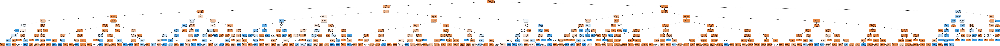

In [16]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [17]:
graph.write_png("../Assets/dtreeFull.png")

True

In [18]:
cnf_matrix = confusion_matrix(data[split:,-1], pred)
np.set_printoptions(precision=2)

[[5432  266]
 [2299  241]]


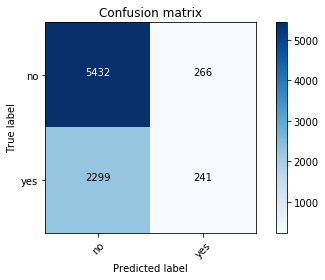

In [19]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['no','yes'],
                      title='Confusion matrix')
plt.show()

In [20]:
print(f1_score(data[split:,-1], pred))

0.1581883820150968


## Random Forest

In [21]:
rf = RandomForestClassifier(n_estimators=100,max_depth=10)
pred = rf.fit(data[:split,:-1],data[:split,-1]).predict(data[split:,:-1])
print('Training Accuracy: ' + str(rf.score(data[:,:-1],data[:,-1])) )
print('Validation Accuracy: ' + str(rf.score(data[split:,:-1],data[split:,-1])) )

Training Accuracy: 0.8932941633485482
Validation Accuracy: 0.6938577324593348


In [22]:
cnf_matrix = confusion_matrix(data[split:,-1], pred)
np.set_printoptions(precision=2)

[[5684   14]
 [2508   32]]


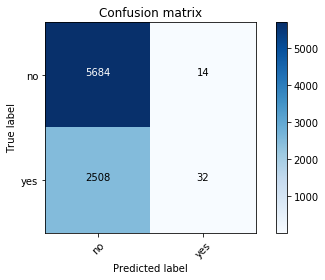

In [23]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['no','yes'],
                      title='Confusion matrix')
plt.show()

In [24]:
print(f1_score(data[split:,-1], pred))

0.024748646558391336


## Support Vector Machine

In [25]:
svm = SVC(gamma='auto')
pred = svm.fit(data[:split,:-1],data[:split,-1]).predict(data[split:,:-1])
print('Training Accuracy: ' + str(svm.score(data[:,:-1],data[:,-1])) )
print('Validation Accuracy: ' + str(svm.score(data[split:,:-1],data[split:,-1])) )

Training Accuracy: 0.8907448771486841
Validation Accuracy: 0.6916727361009953


In [26]:
cnf_matrix = confusion_matrix(data[split:,-1], pred)
np.set_printoptions(precision=2)

[[5697    1]
 [2539    1]]


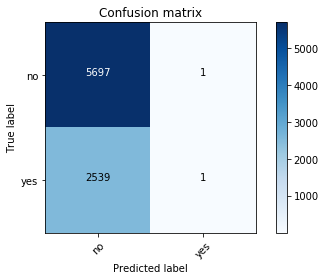

In [27]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['no','yes'],
                      title='Confusion matrix')
plt.show()

In [28]:
print(f1_score(data[split:,-1], pred))

0.0007867820613690009


## Principal Component Analysis

In [29]:
data_x = data[:,:-1]
pca = PCA(n_components=5)
data_x = pca.fit_transform(data_x)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[8.87e-01 1.09e-01 2.70e-03 5.13e-04 3.21e-04]
[38380.77 13456.51  2119.12   923.02   729.84]


## Table Showing relations of Principle Components with various attributes of Data Frame

In [30]:
print(pd.DataFrame(pca.components_,columns=df.columns[:-1],index = ['PC-1','PC-2','PC-3','PC-4','PC-5']))

           age       job   marital  education   default   housing      loan  \
PC-1  0.001914  0.000551  0.000136   0.000543 -0.000193  0.000068 -0.000002   
PC-2  0.000512  0.000432  0.000692   0.000748 -0.001028  0.000662 -0.000044   
PC-3  0.996975  0.000443 -0.022868  -0.024915  0.006594 -0.000299 -0.000538   
PC-4 -0.066737  0.116726  0.005266   0.064648 -0.002123 -0.006364 -0.002058   
PC-5  0.010481  0.985138  0.004469   0.108373 -0.003764  0.003730 -0.001589   

       contact     month  day_of_week  campaign     pdays  previous  poutcome  \
PC-1 -0.000335  0.000742     0.000056 -0.000882 -0.986683  0.001581  0.000876   
PC-2 -0.001712  0.007572    -0.000736 -0.005478  0.162591  0.002015 -0.001899   
PC-3  0.000904 -0.006020    -0.002251  0.001775  0.002053  0.000029  0.000270   
PC-4  0.024652  0.026884     0.013327 -0.028776  0.003668 -0.006672  0.007159   
PC-5 -0.009899 -0.053100    -0.004249  0.003601  0.000100  0.001502 -0.001237   

      emp.var.rate  cons.price.idx  co

In [31]:
print(data_x.shape)

(41188, 5)


## Applying same algorithms on data obtained after PCA

## Decision Tree

In [32]:
dt = DecisionTreeClassifier(max_depth=9)
pred = dt.fit(data_x[:split],data[:split,-1]).predict(data_x[split:])
print('Training Accuracy: ' + str(dt.score(data_x[:],data[:,-1])) )
print('Validation Accuracy: ' + str(dt.score(data_x[split:],data[split:,-1])) )

Training Accuracy: 0.8894580945906575
Validation Accuracy: 0.6762563729060451


In [33]:
cnf_matrix = confusion_matrix(data[split:,-1], pred)
np.set_printoptions(precision=2)

[[5193  505]
 [2162  378]]


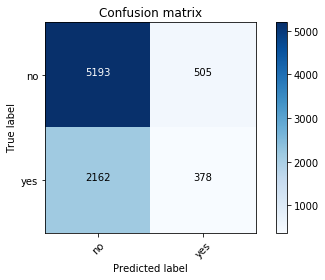

In [34]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['no','yes'],
                      title='Confusion matrix')
plt.show()

In [35]:
print(f1_score(data[split:,-1], pred))

0.22085889570552147


In [36]:
dot_data = StringIO()
export_graphviz(dt,out_file=dot_data,filled=True,rounded=True)

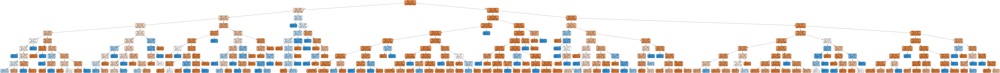

In [37]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [38]:
graph.write_png("../Assets/dtreePCAFull.png")

True

## Random Forest

In [47]:
rf = RandomForestClassifier(n_estimators=100,max_depth=10)
pred = rf.fit(data_x[:split],data[:split,-1]).predict(data_x[split:])
print('Training Accuracy: ' + str(rf.score(data_x[:],data[:,-1])) )
print('Validation Accuracy: ' + str(rf.score(data_x[split:],data[split:,-1])) )

Training Accuracy: 0.893415557929494
Validation Accuracy: 0.6919155134741443


In [48]:
cnf_matrix = confusion_matrix(data[split:,-1], pred)
np.set_printoptions(precision=2)

[[5653   45]
 [2493   47]]


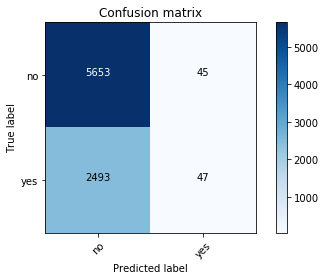

In [49]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['no','yes'],
                      title='Confusion matrix')
plt.show()

In [50]:
print(f1_score(data[split:,-1], pred))

0.03571428571428572


## Support Vector Macines

In [43]:
svm = SVC(gamma='auto')
pred = svm.fit(data_x[:split],data[:split,-1]).predict(data_x[split:])
print('Training Accuracy: ' + str(svm.score(data_x[:],data[:,-1])) )
print('Validation Accuracy: ' + str(svm.score(data_x[split:],data[split:,-1])) )

Training Accuracy: 0.8895066524230358
Validation Accuracy: 0.6911871813546977


In [44]:
cnf_matrix = confusion_matrix(data[split:,-1], pred)
np.set_printoptions(precision=2)

[[5692    6]
 [2538    2]]


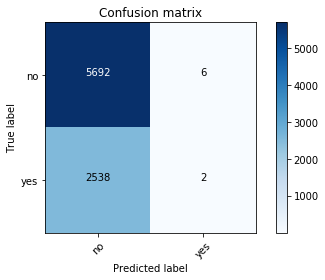

In [45]:
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['no','yes'],
                      title='Confusion matrix')
plt.show()

In [46]:
print(f1_score(data[split:,-1], pred))

0.0015698587127158554
